In [1]:
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from time import time
from torchvision import datasets, transforms
from torch import nn, optim
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.image as mpimg


import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image


In [2]:
dev = None
if torch.cuda.is_available():
    dev = "cuda:0"
else:
    dev = "cpu"

device = torch.device(dev)

/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/torch/cuda/__init__.py:80: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272126608/work/c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


In [3]:
device

device(type='cpu')

In [4]:
# Parameters
batch_size = 64
image_size = 64

eps=1e-7
# z_size = 50
# ngf=32
# nc = 1

# Root directory for dataset
dataroot = "./pokemon"

# Number of workers for dataloader
workers = 4

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 256

# Size of feature maps in discriminator
ndf = 256

# Number of training epochs
num_epochs = 15

# Learning rate for optimizers
lr = 0.0001

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Dataset

In [5]:
class CustomDataSet(Dataset):
    def __init__(self, main_dir, transform):
        self.main_dir = main_dir
        self.transform = transform
        all_imgs = [img for img in os.listdir(main_dir) if img.lower().endswith(".png") and "-back-" not in img and os.stat(os.path.join(main_dir, img)).st_size > 900]
        self.total_imgs = sorted(all_imgs)

    def __len__(self):
        return len(self.total_imgs)

    def __getitem__(self, idx):
        img_loc = os.path.join(self.main_dir, self.total_imgs[idx])
        image = Image.open(img_loc).convert("RGB")
        tensor_image = self.transform(image)
        return tensor_image


In [6]:
transform = transforms.Compose(
    [transforms.Resize((image_size,image_size)), transforms.CenterCrop(image_size), transforms.RandomHorizontalFlip(), transforms.RandomVerticalFlip(), torchvision.transforms.functional.to_grayscale, transforms.ToTensor(), transforms.Normalize((0.5), (0.5)),]
) #transforms.Resize(image_size),
# Try a few different normalizations
# and make sure generators output to the same range, then generator doesn't have to learn range

In [7]:
img_folder_path = "./pokemon"

In [8]:
my_dataset = CustomDataSet(img_folder_path, transform=transform)
trainloader = torch.utils.data.DataLoader(my_dataset , batch_size=batch_size, shuffle=True, 
                               num_workers=4, drop_last=True)


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


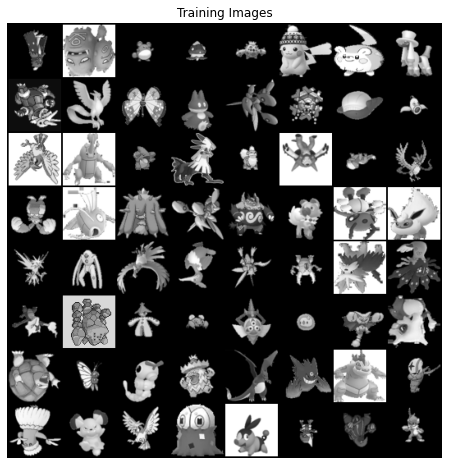

In [9]:
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [10]:
# trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
# valloader = torch.utils.data.DataLoader(valset, batch_size=64, shuffle=True)

In [11]:
len(trainloader)

231

# Networks

In [12]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [13]:
class DiscriminatorConvNet(nn.Module):    
    def __init__(self):
        super(DiscriminatorConvNet, self).__init__()

        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            
            nn.Conv2d(ndf * 8, ndf * 16, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
#             nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 16),
#             nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
            nn.Flatten(start_dim=1)
        )
    

    def forward(self, x):
        return self.main(x)

D = DiscriminatorConvNet().to(device)
# D.apply(weights_init)
D

DiscriminatorConvNet(
  (main): Sequential(
    (0): Conv2d(1, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(1024, 2048, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (12): BatchNorm2d(204

In [14]:
# test input
inp = torch.randn(2,nc,image_size,image_size).to(device)
d_out = D(inp)
print(d_out)
d_image_out = D(real_batch.to(device))
print(d_image_out.shape)

tensor([[0.4944],
        [0.5513]], grad_fn=<ReshapeAliasBackward0>)
torch.Size([64, 1])


# Define the generator network

In [15]:
class GeneratorConvNet(nn.Module):
    def __init__(self):
        super(GeneratorConvNet, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
#             nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
#             nn.Conv2d(ngf * 8, ngf * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 4, ngf*2, 4, 2,1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            
            nn.Conv2d(ngf * 2, ngf * 2, 5, 1, 2, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ngf*2) x 32 x 32
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            
            nn.Conv2d(ngf, ngf, 5, 1, 2, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ngf, ngf, 5, 1, 2, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, x):
        return self.main(x)

G = GeneratorConvNet().to(device)
# G.apply(weights_init)
G

GeneratorConvNet(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(256, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias

In [16]:
# test input
inp = torch.randn(2, nz, 1, 1).to(device)
g_out = G(inp)
print(g_out.shape)

torch.Size([2, 1, 64, 64])


In [17]:
# Try running G out through D
d_of_g_out = D(g_out)
print(d_of_g_out)

tensor([[0.5367],
        [0.4624]], grad_fn=<ReshapeAliasBackward0>)


In [18]:
noise_generator = lambda x: torch.FloatTensor(x, nz, 1, 1).uniform_(0, 1) # pg(z) torch.randn(x, z_size)
noise_generator(2).shape

torch.Size([2, 100, 1, 1])

# Train algorithm

In [19]:
# Define the train parameters
# num_epochs = 12
# batch_size = 128
k_steps = 1
num_val_batches = 10


In [20]:
dataloader = trainloader = torch.utils.data.DataLoader(my_dataset, batch_size=batch_size, shuffle=True, 
                               num_workers=4, drop_last=True)

#pdata(x)
# train_real_sampler = iter(trainloader)
# val_real_sampler = train_real_sampler

In [21]:
# pg(z)
noise_generator = lambda x: torch.FloatTensor(x, nz, 1, 1).to(device)
noise_generator(2).shape

torch.Size([2, 100, 1, 1])

In [22]:
optimizerD = optim.Adam(D.parameters(), lr=lr/5, betas=(beta1, 0.999))
optimizerG = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

In [23]:
D.to(device)
G.to(device)

# G.apply(weights_init)
# D.apply(weights_init)

GeneratorConvNet(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(256, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias

In [24]:
criterion = nn.BCELoss()
real_label = 1.
fake_label = 0.

fixed_noise = torch.randn(64, nz, 1, 1, device=device)


In [25]:
def save_checkpoint(path, epoch, net, optimizer, loss):
    torch.save({
            'epoch': epoch,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            }, path)

def load_from_checkpoint(path, model, optimizer):
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    return model, optimizer, epoch, loss


In [26]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
broke = False
lowest_G_loss = 1.0
lowest_D_loss = 1.0
best_D_of_G = 0.55
best_D_of_x = 0.1

last_best_G_loss_path = None
last_best_D_of_x_path = None

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = D(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

#         if epoch > 1:
#             if errG.item() < lowest_G_loss:
#                 lowest_G_loss = errG.item()
#                 path = f"./checkpoints/best_G_loss/model_e{epoch:03}_i{i:03}.pt"
#                 save_checkpoint(path, epoch, G, optimizerG, lowest_G_loss)
#                 last_best_G_loss_path = path
            
#             if abs(D_x) - 0.5 < best_D_of_x:
#                 best_D_of_x = abs(D_x) - 0.5
#                 path = f"./checkpoints/best_D_x/model_e{epoch:03}_i{i:03}.pt"
#                 save_checkpoint(path, epoch, G, optimizerG, best_D_of_x)
#                 last_best_D_of_x_path = path
            

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
    if broke: break

Starting Training Loop...


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[0/15][0/231]	Loss_D: 1.3488	Loss_G: 1.8096	D(x): 0.5460	D(G(z)): 0.5100 / 0.1683
[0/15][50/231]	Loss_D: 0.5795	Loss_G: 4.7125	D(x): 0.7232	D(G(z)): 0.0589 / 0.0570
[0/15][100/231]	Loss_D: 1.1198	Loss_G: 3.0874	D(x): 0.6577	D(G(z)): 0.3075 / 0.0744
[0/15][150/231]	Loss_D: 1.4526	Loss_G: 3.1728	D(x): 0.4809	D(G(z)): 0.4162 / 0.0649
[0/15][200/231]	Loss_D: 0.8943	Loss_G: 2.4633	D(x): 0.6645	D(G(z)): 0.3227 / 0.1364


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[1/15][0/231]	Loss_D: 1.3499	Loss_G: 2.0246	D(x): 0.5944	D(G(z)): 0.5105 / 0.1801
[1/15][50/231]	Loss_D: 0.6689	Loss_G: 2.1003	D(x): 0.7062	D(G(z)): 0.2314 / 0.1466
[1/15][100/231]	Loss_D: 1.2211	Loss_G: 1.2149	D(x): 0.5333	D(G(z)): 0.3902 / 0.3269
[1/15][150/231]	Loss_D: 0.9253	Loss_G: 2.1635	D(x): 0.7238	D(G(z)): 0.3957 / 0.1366
[1/15][200/231]	Loss_D: 1.1201	Loss_G: 1.8409	D(x): 0.5330	D(G(z)): 0.3152 / 0.1895


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[2/15][0/231]	Loss_D: 1.6402	Loss_G: 1.4912	D(x): 0.5202	D(G(z)): 0.5802 / 0.2529
[2/15][50/231]	Loss_D: 1.2698	Loss_G: 1.5627	D(x): 0.6511	D(G(z)): 0.5279 / 0.2305
[2/15][100/231]	Loss_D: 1.1899	Loss_G: 1.7926	D(x): 0.5607	D(G(z)): 0.4071 / 0.2009
[2/15][150/231]	Loss_D: 1.2136	Loss_G: 1.9166	D(x): 0.6514	D(G(z)): 0.5102 / 0.1701
[2/15][200/231]	Loss_D: 1.0760	Loss_G: 1.5695	D(x): 0.5422	D(G(z)): 0.2994 / 0.2374


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[3/15][0/231]	Loss_D: 1.2406	Loss_G: 1.3014	D(x): 0.5863	D(G(z)): 0.4735 / 0.2909
[3/15][50/231]	Loss_D: 1.6420	Loss_G: 1.1018	D(x): 0.4581	D(G(z)): 0.5193 / 0.3572
[3/15][100/231]	Loss_D: 1.1962	Loss_G: 1.3442	D(x): 0.5619	D(G(z)): 0.4329 / 0.2901
[3/15][150/231]	Loss_D: 1.3523	Loss_G: 1.0146	D(x): 0.4746	D(G(z)): 0.4107 / 0.3792
[3/15][200/231]	Loss_D: 1.2640	Loss_G: 1.1602	D(x): 0.6095	D(G(z)): 0.5087 / 0.3338


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[4/15][0/231]	Loss_D: 1.3414	Loss_G: 1.1047	D(x): 0.5234	D(G(z)): 0.4641 / 0.3450
[4/15][50/231]	Loss_D: 1.1048	Loss_G: 1.2846	D(x): 0.5862	D(G(z)): 0.4154 / 0.2856
[4/15][100/231]	Loss_D: 1.2900	Loss_G: 1.1573	D(x): 0.5188	D(G(z)): 0.4304 / 0.3316
[4/15][150/231]	Loss_D: 1.1069	Loss_G: 1.1971	D(x): 0.5271	D(G(z)): 0.3430 / 0.3239
[4/15][200/231]	Loss_D: 1.1031	Loss_G: 1.5449	D(x): 0.7032	D(G(z)): 0.5108 / 0.2276


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[5/15][0/231]	Loss_D: 1.1017	Loss_G: 1.1311	D(x): 0.5721	D(G(z)): 0.3896 / 0.3549
[5/15][50/231]	Loss_D: 1.0820	Loss_G: 1.3023	D(x): 0.5213	D(G(z)): 0.3007 / 0.2854
[5/15][100/231]	Loss_D: 1.3930	Loss_G: 1.0783	D(x): 0.4874	D(G(z)): 0.4551 / 0.3551
[5/15][150/231]	Loss_D: 1.1077	Loss_G: 1.2450	D(x): 0.5748	D(G(z)): 0.4039 / 0.3050
[5/15][200/231]	Loss_D: 1.3657	Loss_G: 1.1201	D(x): 0.5084	D(G(z)): 0.4642 / 0.3440


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[6/15][0/231]	Loss_D: 1.2935	Loss_G: 1.1427	D(x): 0.5517	D(G(z)): 0.4773 / 0.3364
[6/15][50/231]	Loss_D: 1.3173	Loss_G: 1.1132	D(x): 0.5026	D(G(z)): 0.4233 / 0.3475
[6/15][100/231]	Loss_D: 1.3577	Loss_G: 1.2242	D(x): 0.5524	D(G(z)): 0.4989 / 0.3105
[6/15][150/231]	Loss_D: 1.0828	Loss_G: 1.1321	D(x): 0.5580	D(G(z)): 0.3595 / 0.3457
[6/15][200/231]	Loss_D: 1.1755	Loss_G: 1.1961	D(x): 0.5982	D(G(z)): 0.4526 / 0.3176


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[7/15][0/231]	Loss_D: 1.5939	Loss_G: 0.7226	D(x): 0.4067	D(G(z)): 0.4329 / 0.5109
[7/15][50/231]	Loss_D: 1.2116	Loss_G: 1.2428	D(x): 0.6426	D(G(z)): 0.5099 / 0.3044
[7/15][100/231]	Loss_D: 1.2742	Loss_G: 1.1720	D(x): 0.6081	D(G(z)): 0.5159 / 0.3251
[7/15][150/231]	Loss_D: 1.5165	Loss_G: 1.5867	D(x): 0.6398	D(G(z)): 0.6307 / 0.2153
[7/15][200/231]	Loss_D: 1.2706	Loss_G: 1.1651	D(x): 0.6197	D(G(z)): 0.5240 / 0.3248


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[8/15][0/231]	Loss_D: 1.2371	Loss_G: 1.3064	D(x): 0.6119	D(G(z)): 0.4969 / 0.2847
[8/15][50/231]	Loss_D: 1.2122	Loss_G: 1.0758	D(x): 0.5300	D(G(z)): 0.4125 / 0.3569
[8/15][100/231]	Loss_D: 1.4626	Loss_G: 1.3721	D(x): 0.6857	D(G(z)): 0.6293 / 0.2752
[8/15][150/231]	Loss_D: 1.1594	Loss_G: 1.7275	D(x): 0.6848	D(G(z)): 0.5122 / 0.1926
[8/15][200/231]	Loss_D: 1.2493	Loss_G: 0.8018	D(x): 0.4043	D(G(z)): 0.2136 / 0.4708


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[9/15][0/231]	Loss_D: 1.2385	Loss_G: 2.4563	D(x): 0.6568	D(G(z)): 0.5366 / 0.0924
[9/15][50/231]	Loss_D: 1.1278	Loss_G: 1.6097	D(x): 0.7001	D(G(z)): 0.5208 / 0.2094
[9/15][100/231]	Loss_D: 0.9131	Loss_G: 1.6406	D(x): 0.5548	D(G(z)): 0.2167 / 0.2071
[9/15][150/231]	Loss_D: 0.9722	Loss_G: 1.5651	D(x): 0.6342	D(G(z)): 0.3766 / 0.2308
[9/15][200/231]	Loss_D: 1.0619	Loss_G: 1.5767	D(x): 0.6234	D(G(z)): 0.4185 / 0.2206


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[10/15][0/231]	Loss_D: 1.0742	Loss_G: 1.8018	D(x): 0.6975	D(G(z)): 0.4415 / 0.1811
[10/15][50/231]	Loss_D: 0.8876	Loss_G: 1.6602	D(x): 0.6360	D(G(z)): 0.3270 / 0.2078
[10/15][100/231]	Loss_D: 1.1605	Loss_G: 2.2146	D(x): 0.3851	D(G(z)): 0.0484 / 0.1247
[10/15][150/231]	Loss_D: 0.3967	Loss_G: 2.7600	D(x): 0.9157	D(G(z)): 0.2552 / 0.0722
[10/15][200/231]	Loss_D: 0.6706	Loss_G: 3.0680	D(x): 0.8609	D(G(z)): 0.3834 / 0.0511


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[11/15][0/231]	Loss_D: 0.9707	Loss_G: 4.1297	D(x): 0.8634	D(G(z)): 0.5382 / 0.0189
[11/15][50/231]	Loss_D: 0.8962	Loss_G: 2.0793	D(x): 0.7939	D(G(z)): 0.4620 / 0.1390
[11/15][100/231]	Loss_D: 0.9526	Loss_G: 1.8148	D(x): 0.8355	D(G(z)): 0.5065 / 0.1886
[11/15][150/231]	Loss_D: 0.7767	Loss_G: 1.7005	D(x): 0.6627	D(G(z)): 0.2746 / 0.2115
[11/15][200/231]	Loss_D: 1.0248	Loss_G: 2.3055	D(x): 0.7080	D(G(z)): 0.4487 / 0.1290


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[12/15][0/231]	Loss_D: 1.1955	Loss_G: 2.1684	D(x): 0.8952	D(G(z)): 0.6369 / 0.1392
[12/15][50/231]	Loss_D: 0.8545	Loss_G: 2.1990	D(x): 0.8403	D(G(z)): 0.4756 / 0.1218
[12/15][100/231]	Loss_D: 0.8193	Loss_G: 1.9002	D(x): 0.7223	D(G(z)): 0.3661 / 0.1648
[12/15][150/231]	Loss_D: 1.2030	Loss_G: 1.4981	D(x): 0.7045	D(G(z)): 0.5326 / 0.2558
[12/15][200/231]	Loss_D: 0.9588	Loss_G: 1.7262	D(x): 0.7101	D(G(z)): 0.4281 / 0.2017


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[13/15][0/231]	Loss_D: 1.0172	Loss_G: 1.7075	D(x): 0.5388	D(G(z)): 0.2494 / 0.2250
[13/15][50/231]	Loss_D: 1.2605	Loss_G: 1.2221	D(x): 0.4449	D(G(z)): 0.2929 / 0.3223
[13/15][100/231]	Loss_D: 1.2802	Loss_G: 3.0140	D(x): 0.8219	D(G(z)): 0.6342 / 0.0595
[13/15][150/231]	Loss_D: 1.1185	Loss_G: 2.6210	D(x): 0.7929	D(G(z)): 0.5479 / 0.0826
[13/15][200/231]	Loss_D: 0.8909	Loss_G: 1.4844	D(x): 0.4822	D(G(z)): 0.0730 / 0.2703


/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


[14/15][0/231]	Loss_D: 0.9094	Loss_G: 1.8592	D(x): 0.7650	D(G(z)): 0.4305 / 0.1827
[14/15][50/231]	Loss_D: 0.8026	Loss_G: 1.5046	D(x): 0.5900	D(G(z)): 0.2147 / 0.2440
[14/15][100/231]	Loss_D: 0.9359	Loss_G: 1.6011	D(x): 0.5626	D(G(z)): 0.2514 / 0.2334
[14/15][150/231]	Loss_D: 0.7861	Loss_G: 2.2485	D(x): 0.5479	D(G(z)): 0.1378 / 0.1196
[14/15][200/231]	Loss_D: 0.9862	Loss_G: 2.3356	D(x): 0.8076	D(G(z)): 0.5038 / 0.1179


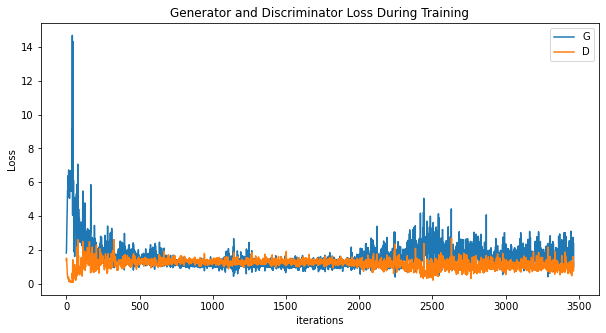

In [27]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

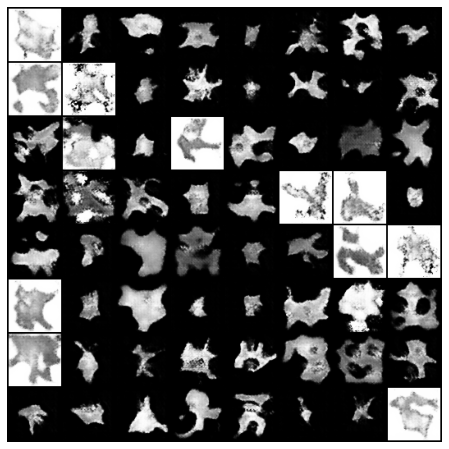

In [28]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/home/tysonbul/miniconda3/envs/gan/lib/python3.7/site-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


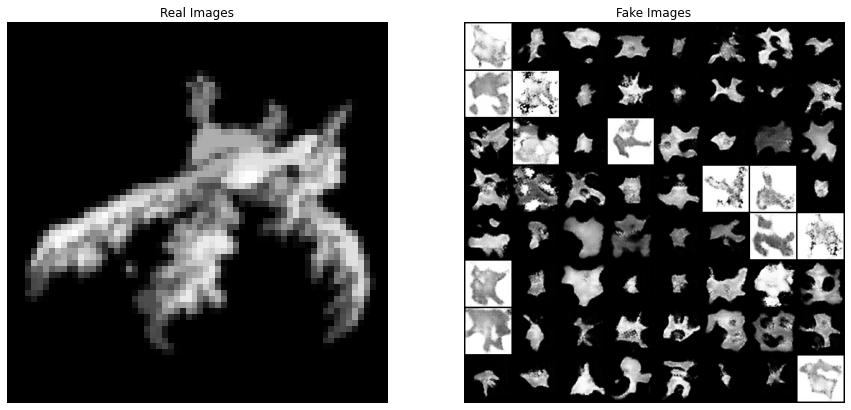

In [29]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

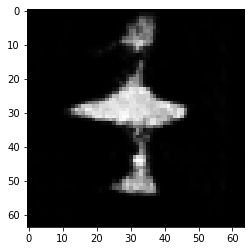

In [30]:
plt.imshow(np.transpose(G(torch.randn(b_size, nz, 1, 1, device=device)).detach().cpu()[0],(1,2,0)), cmap='Greys_r')
plt.show()
# G(torch.randn(b_size, nz, 1, 1, device=device)).detach().cpu().shape

In [31]:
def generate_image(net):
    plt.imshow(np.transpose(net(torch.randn(b_size, nz, 1, 1, device=device)).detach().cpu()[0],(1,2,0)), cmap='Greys_r')
    plt.show()

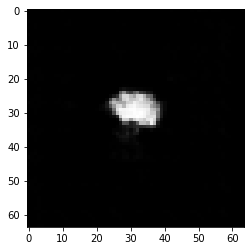

In [69]:
generate_image(G)

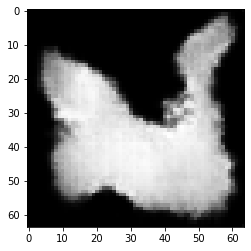

In [33]:
generate_image(G)

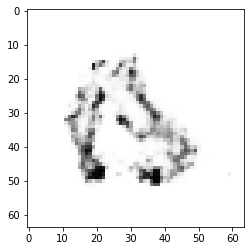

In [34]:
generate_image(G)

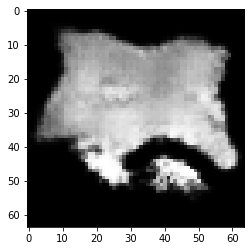

In [35]:
generate_image(G)

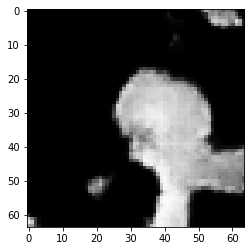

In [36]:
# img_list[-1][:,:64,:64].shape
i = 8
j = 4
plt.imshow(np.transpose(img_list[-1][:,image_size * (i-1):image_size*i,image_size*(j-1):image_size*j],(1,2,0)))
plt.show()
# G(torch.randn(b_size, nz, 1, 1, device=device)).detach().cpu().shape

In [37]:
model, optimizer, epoch, loss = load_from_checkpoint(last_best_G_loss_path, G, optimizerG)
epoch, loss

AttributeError: 'NoneType' object has no attribute 'seek'. You can only torch.load from a file that is seekable. Please pre-load the data into a buffer like io.BytesIO and try to load from it instead.

In [ ]:
generate_image(model)

In [ ]:
generate_image(model)

In [ ]:
generate_image(model)

In [ ]:
model, optimizer, epoch, loss = load_from_checkpoint(last_best_D_of_x_path, G, optimizerG)
epoch, loss

In [ ]:
generate_image(model)

In [ ]:
generate_image(model)

In [ ]:
generate_image(model)